<a href="https://colab.research.google.com/github/AdamPrzychodniPrivate/ml-drought-forecasting/blob/main/ml-modeling-pipeline/notebooks/Real_data_STGNN_Prototype_for_Drought_Forecasting_in_East_Africa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# STGNN Prototype for Drought Forecasting in East Africa



Due to a PyTorch version change in the Colab environment to 2.4.0+cu121, we need to first uninstall the current version and then install torch 2.3.1+cu121, which is required for our other libraries. Unfortunately, this process takes about 3 minutes to complete :(


In [3]:
import os
# Uninstall the current PyTorch version
os.system(f"pip uninstall -y torch torchvision torchaudio")

# Install the desired PyTorch version
os.system(f"pip install torch==2.3.1 torchvision==0.18.1 torchaudio==2.3.1 --index-url https://download.pytorch.org/whl/cu121")

0

In [4]:
import torch
os.environ['TORCH'] = torch.__version__
print(torch.__version__)

2.3.1+cu121


In [5]:
os.system(f"pip install torch-scatter -f https://data.pyg.org/whl/torch-2.3.0+cu121.html")
os.system(f"pip install torch-sparse -f https://data.pyg.org/whl/torch-2.3.0+cu121.html")
os.system(f"pip install torch-geometric")
os.system(f"pip install -q git+https://github.com/TorchSpatiotemporal/tsl.git")

0

# Loading and Preprocessing Data

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
import tsl
import numpy as np
import pandas as pd
import random
from pathlib import Path
from tsl.ops.similarities import gaussian_kernel
from scipy.spatial.distance import pdist, squareform
from tsl.ops.similarities import geographical_distance
from typing import Optional, Union, List

# Format pandas DataFrame floats to 3 decimal places.

pd.options.display.float_format = '{:.3f}'.format

# Set NumPy floats precision to 3 and limit array display.
np.set_printoptions(edgeitems=3, precision=3)

# Set PyTorch floats precision to 3 and limit tensor display.
torch.set_printoptions(edgeitems=2, precision=3)

In [8]:
print(f"tsl version  : {tsl.__version__}")
print(f"torch version: {torch.__version__}")

tsl version  : 0.9.5
torch version: 2.3.1+cu121


## Load raw data

In [9]:
df = pd.read_parquet("/content/drive/MyDrive/data/preprocessed_data.parquet")
df['time'] = pd.to_datetime(df['time'])

In [10]:
df

,lat,lon,time,PRECTOTCORR,T2M,T2M_MAX,T2M_MIN,TS,PS,WS2M,...,eddi_09mn,eddi_12mn,Nino12_lag6m,Nino3_lag6m,Nino34_lag6m,Nino4_lag6m,WTIO_lag3m,SETIO_lag3m,DMI_lag3m,SWIO_lag3m
0,-4.500,36.875,1981-09-06,0.000,293.579,301.492,287.537,296.364,88202.205,4.453,...,-2.158,-2.158,-0.477,-0.229,-0.219,-0.045,-0.510,-0.169,-0.341,-0.896
1,-4.500,37.500,1981-09-06,0.000,294.169,301.609,288.626,296.686,90877.446,3.647,...,-2.158,-2.158,-0.477,-0.229,-0.219,-0.045,-0.510,-0.169,-0.341,-0.896
2,-4.500,38.125,1981-09-06,0.000,293.935,301.243,288.412,295.907,92061.670,2.674,...,-2.158,-2.158,-0.477,-0.229,-0.219,-0.045,-0.510,-0.169,-0.341,-0.896
3,-4.500,38.750,1981-09-06,0.000,295.993,302.423,291.340,297.544,96825.875,3.242,...,-2.158,-2.158,-0.477,-0.229,-0.219,-0.045,-0.510,-0.169,-0.341,-0.896
4,-4.500,39.375,1981-09-06,0.000,298.104,301.304,295.663,299.335,100592.393,4.148,...,-2.158,-2.158,-0.477,-0.229,-0.219,-0.045,-0.510,-0.169,-0.341,-0.896
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3650455,22.000,33.125,2024-04-28,0.000,302.766,311.246,295.191,304.777,97286.125,4.527,...,1.555,1.782,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230
3650456,22.000,34.375,2024-04-28,0.000,304.262,312.602,296.281,307.758,95978.781,2.867,...,1.388,1.555,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230
3650457,22.000,35.000,2024-04-28,0.000,302.746,311.352,295.352,306.961,93670.812,2.500,...,1.253,1.555,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230
3650458,22.000,35.625,2024-04-28,0.000,301.172,310.258,294.105,305.844,93352.125,3.406,...,1.195,1.555,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230


In [11]:
df = df[df['time'] >= '2000-01-01']

In [12]:
df

,lat,lon,time,PRECTOTCORR,T2M,T2M_MAX,T2M_MIN,TS,PS,WS2M,...,eddi_09mn,eddi_12mn,Nino12_lag6m,Nino3_lag6m,Nino34_lag6m,Nino4_lag6m,WTIO_lag3m,SETIO_lag3m,DMI_lag3m,SWIO_lag3m
1567660,-11.500,35.000,2000-01-02,0.000,299.391,303.731,295.590,300.693,91915.500,2.874,...,-1.239,-1.241,-0.308,-1.668,-1.761,-1.068,-0.629,-0.330,-0.299,0.850
1567661,-11.500,35.625,2000-01-02,0.000,298.959,305.189,293.871,299.720,93330.455,1.930,...,-1.239,-1.139,-0.308,-1.668,-1.761,-1.068,-0.629,-0.330,-0.299,0.850
1567662,-11.500,36.250,2000-01-02,0.000,299.382,305.689,294.193,300.300,94047.920,2.209,...,-1.248,-0.979,-0.308,-1.668,-1.761,-1.068,-0.629,-0.330,-0.299,0.850
1567663,-11.500,36.875,2000-01-02,0.000,299.875,306.134,294.580,300.862,94964.348,2.470,...,-1.122,-0.889,-0.308,-1.668,-1.761,-1.068,-0.629,-0.330,-0.299,0.850
1567664,-11.500,37.500,2000-01-02,0.000,299.761,305.647,294.711,300.586,95922.634,2.395,...,-1.036,-0.755,-0.308,-1.668,-1.761,-1.068,-0.629,-0.330,-0.299,0.850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3650455,22.000,33.125,2024-04-28,0.000,302.766,311.246,295.191,304.777,97286.125,4.527,...,1.555,1.782,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230
3650456,22.000,34.375,2024-04-28,0.000,304.262,312.602,296.281,307.758,95978.781,2.867,...,1.388,1.555,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230
3650457,22.000,35.000,2024-04-28,0.000,302.746,311.352,295.352,306.961,93670.812,2.500,...,1.253,1.555,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230
3650458,22.000,35.625,2024-04-28,0.000,301.172,310.258,294.105,305.844,93352.125,3.406,...,1.195,1.555,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230


In [122]:
df['eddi_06mn'].describe()

,eddi_06mn
count,2082800.000
mean,0.246
std,0.985
min,-2.168
25%,-0.417
50%,0.302
75%,0.950
max,2.173


## Building class based DatetimeDataset from tsl library

What we will need to create our DatetimeDataset class?

We need:
- data - DataFrame containing the data related to the main signals. The index is considered as the temporal dimension. The columns are identified as:

  - (nodes, channels): there are two levels (columns is a MultiIndex). We assume nodes are at first level, channels at second.

- metadata
- distance matrix

### Data

In [13]:
def process_dataframe(df: pd.DataFrame) -> pd.DataFrame:
    """
    Process the input DataFrame to create unique node IDs based on latitude and longitude,
    reshape and pivot the data, and return the DataFrame formatted for use as the 'target'
    parameter in a DatetimeDataset.

    Parameters:
    df (pd.DataFrame): The input DataFrame with columns 'lat', 'lon', 'time', 'variable_1', 'variable_2', ... , 'variable_n'

    Returns:
    pd.DataFrame: The processed DataFrame with MultiIndex columns (node_id, channels)
                  and the index set as the temporal dimension.
    """

    # Create a unique node ID for each unique lat-lon combination
    unique_lat_lon = df[['lat', 'lon']].drop_duplicates().reset_index(drop=True)
    unique_lat_lon['node_id'] = unique_lat_lon.index

    # Merge this mapping back to the original DataFrame
    df = df.merge(unique_lat_lon, on=['lat', 'lon'], how='left')
    df = df.drop(['lat', 'lon'], axis=1)

    # Dynamically determine the value variables
    id_vars = ['time', 'node_id']
    value_vars = [col for col in df.columns if col not in id_vars]

    # Reshape the DataFrame using pd.melt
    df_melted = pd.melt(df, id_vars=id_vars, value_vars=value_vars)
    df_melted.rename(columns={'variable': 'channels'}, inplace=True)

    # Pivot the table and sort MultiIndex
    df_pivoted = df_melted.pivot_table(index='time', columns=['node_id', 'channels'], values='value')
    df_pivoted.sort_index(axis=0, inplace=True)
    df_pivoted.sort_index(axis=1, inplace=True)

    # Save as .parquet file
    df_pivoted.to_parquet("data.parquet")

    return df_pivoted

# Example usage:
# data = process_dataframe(df)

In [14]:
# data

### Metadata

In [15]:
def generate_and_save_metadata(df: pd.DataFrame, lat_col: str = 'lat', lon_col: str = 'lon') -> pd.DataFrame:
    """
    Generates metadata from a given DataFrame by identifying unique latitude and longitude
    combinations and assigning a unique node ID to each combination. The metadata is then
    saved to a specified Parquet file.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - lat_col (str): The name of the column containing latitude data.
    - lon_col (str): The name of the column containing longitude data.
    - file_name (str): The name of the file to save the metadata to.

    Returns:
    - pd.DataFrame: A DataFrame containing the metadata with latitude, longitude, and 'node_id' as columns.
    """
    # Ensure the DataFrame contains necessary columns
    if lat_col not in df.columns or lon_col not in df.columns:
        raise ValueError(f"DataFrame must contain '{lat_col}' and '{lon_col}' columns.")

    # Create a unique node ID for each unique latitude-longitude combination
    unique_lat_lon = df[[lat_col, lon_col]].drop_duplicates().reset_index(drop=True)
    unique_lat_lon['node_id'] = unique_lat_lon.index

    # Create the metadata DataFrame
    metadata = unique_lat_lon.set_index('node_id')

    # Save metadata to a specified Parquet file
    metadata.to_parquet('metadata.parquet')

    return metadata

# Example usage
# metadata = generate_and_save_metadata(df, lat_col='lat', lon_col='lon')

In [16]:
# metadata = generate_and_save_metadata(df, lat_col='lat', lon_col='lon')

In [17]:
# metadata

### Distance matrix

In [18]:
def calculate_and_save_distance(metadata: pd.DataFrame) -> np.ndarray:
    """
    Calculate the geographical distance matrix from latitude and longitude in the metadata DataFrame,
    save it to a .npy file, and return the numpy array of distances.

    Args:
    metadata (pd.DataFrame): A DataFrame containing at least two columns ['lat', 'lon'] for latitude and longitude.

    Returns:
    np.ndarray: A 2D numpy array containing the calculated distances between each pair of points.
    """
    # Extract latitude and longitude columns from metadata.
    coords = metadata.loc[:, ['lat', 'lon']]

    # Calculate geographical distances with coordinates converted to radians.
    dist = geographical_distance(coords, to_rad=True).values

    # Save as .npy file
    np.save('distance_matrix.npy', dist)

    return dist

# Example usage:
# distance_matrix = calculate_and_save_distance(metadata)

In [19]:
# distance_matrix

## Vizulize data

Below we can see this graph on a map

In [20]:
# add viz

## Build class DroughtDataset based on DatetimeDataset from tsl

## Class DatetimeDataset

https://torch-spatiotemporal.readthedocs.io/en/dev/modules/datasets_prototypes.html#tsl.datasets.prototypes.DatetimeDataset

In [21]:
from typing import Optional

from tsl.datasets.prototypes import DatetimeDataset

class DroughtDataset(DatetimeDataset):
    """
    A dataset class for drought-related data, inheriting from DatetimeDataset.

    This class handles loading and preprocessing of drought data, including
    target variables and all available covariates.

    Attributes:
        similarity_options (set): Available options for similarity calculations.
        root (str): Root directory for data files.
    """

    similarity_options = {'distance', 'correlation'}

    def __init__(self,
                 root: str = None,
                 freq: Optional[str] = None,
                 target_node_feature: str = "eddi"
                 ):
        """
        Initialize the DroughtDataset.

        Args:
            root (str, optional): Root directory for data files.
            freq (str, optional): Frequency for time series data.
            target_node_feature (str, optional): The node feature to use as the target. Defaults to "eddi".
        """
        self.root = root
        self.target_node_feature = target_node_feature

        # Load data
        df, metadata, dist = self.load()

        # Set target
        nodes = metadata.index
        target_columns = pd.MultiIndex.from_product([nodes, [self.target_node_feature]])
        target = df.loc[:, target_columns]

        # Identify all available features (excluding the target feature)
        all_features = [col for col in df.columns.get_level_values(1).unique() if col != self.target_node_feature]

        # Set covariates
        covariate_columns = pd.MultiIndex.from_product([nodes, all_features])
        u = df.loc[:, covariate_columns]

        covariates = {
            'u': (u, 't n f'),  # 'u' for exogenous variables / node features
            'metadata': (metadata, 'n f'),
            'distances': (dist, 'n n')
        }

        super().__init__(target=target,
                         covariates=covariates,
                         freq=freq,
                         similarity_score='distance',
                         temporal_aggregation='mean',
                         spatial_aggregation='mean',
                         name='DroughtDataset')

    def load(self):
        """
        Load data from files.

        Returns:
            tuple: Containing dataframe, metadata, and distance matrix.
        """
        data_path = f"{self.root}data.parquet"
        metadata_path = f"{self.root}metadata.parquet"
        dist_path = f"{self.root}distance_matrix.npy"

        # Load main data
        df = pd.read_parquet(data_path)

        # Load metadata
        metadata = pd.read_parquet(metadata_path)

        # Load distance matrix
        dist = np.load(dist_path)

        return df, metadata, dist

    def compute_similarity(self, method: str, **kwargs):
        """
        Compute similarity matrix based on the specified method.

        Args:
            method (str): The similarity computation method ('distance' or 'correlation').
            **kwargs: Additional keyword arguments for similarity computation.

        Returns:
            numpy.ndarray: Computed similarity matrix.

        Raises:
            ValueError: If an unknown similarity method is provided.
        """
        if method == "distance":
            # Calculate a Gaussian kernel similarity from the distance matrix, using a default or provided 'theta'
            theta = kwargs.get('theta', np.std(self.distances))
            return self.gaussian_kernel(self.distances, theta=theta)
        elif method == "correlation":
            # Calculate the pairwise correlation of the target variable, normalize it to [0, 1]
            corr = self.target.corr().values
            return (corr + 1) / 2  # Normalize to [0, 1]
        else:
            raise ValueError(f"Unknown similarity method: {method}")

    @staticmethod
    def gaussian_kernel(distances, theta):
        """
        Compute Gaussian kernel similarity from distances.

        Args:
            distances (numpy.ndarray): Distance matrix.
            theta (float): Kernel bandwidth parameter.

        Returns:
            numpy.ndarray: Gaussian kernel similarity matrix.
        """
        return np.exp(-(distances ** 2) / (2 * (theta ** 2)))

In [22]:
dataset = DroughtDataset(root='/content/drive/MyDrive/data/', target_node_feature="eddi_06mn")

This is our target variable "eddi_06mn"

In [23]:
dataset.target

nodes,0,1,2,3,4,5,6,7,8,9,...,1630,1631,1632,1633,1634,1635,1636,1637,1638,1639
channels,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,...,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn
time,,,,,,,,,,,,,,,,,,,,,
2000-01-02,-1.205,-1.093,-0.921,-0.841,-0.853,-1.189,-0.980,-1.013,-0.914,-0.708,...,-0.041,0.042,0.066,0.116,0.017,-0.041,-0.057,-0.057,0.100,0.452
2000-01-09,-1.097,-0.940,-0.878,-0.775,-0.598,-1.078,-0.953,-0.918,-0.660,-0.538,...,0.091,0.116,0.120,0.158,0.108,0.009,0.116,0.183,0.217,0.552
2000-01-16,-0.940,-0.773,-0.740,-0.539,-0.338,-0.855,-0.866,-0.706,-0.391,-0.293,...,0.302,0.268,0.294,0.337,0.303,0.200,0.200,0.269,0.420,0.687
2000-01-23,-0.833,-0.688,-0.555,-0.287,-0.182,-0.740,-0.752,-0.476,-0.225,-0.199,...,0.504,0.449,0.423,0.426,0.463,0.464,0.495,0.643,0.778,0.876
2000-01-30,-0.796,-0.687,-0.462,-0.165,-0.174,-0.708,-0.666,-0.416,-0.174,-0.140,...,0.548,0.531,0.462,0.426,0.566,0.586,0.752,0.831,0.854,0.971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-31,0.726,0.634,0.586,0.411,0.359,0.385,0.325,0.212,0.142,0.028,...,0.825,0.647,0.440,0.308,0.300,0.402,0.387,0.386,0.326,-0.013
2024-04-07,0.657,0.512,0.482,0.394,0.283,0.342,0.249,0.131,0.012,-0.012,...,0.597,0.450,0.189,0.045,0.037,0.111,0.209,0.176,0.118,-0.249


The covariates include:

- "u", node features
- metadata (latitude and longitude for each node)
- distance matrix between nodes

all stored in a dictionary structure.

In [24]:
dataset.covariates

{'u': node_id     0                                                                 \
 channels   DISPH DMI_lag3m Nino12_lag6m Nino34_lag6m Nino3_lag6m Nino4_lag6m   
 time                                                                           
 2000-01-02 1.695    -0.299       -0.308       -1.761      -1.668      -1.068   
 2000-01-09 1.743    -0.017       -0.475       -1.864      -1.942      -1.109   
 2000-01-16 1.775    -0.273       -0.566       -1.876      -1.718      -1.246   
 2000-01-23 1.797     0.439       -0.787       -1.775      -1.737      -1.076   
 2000-01-30 1.815     0.167       -0.720       -1.902      -1.812      -1.240   
 ...          ...       ...          ...          ...         ...         ...   
 2024-03-31 1.844     0.556        0.101        1.149       1.182       0.885   
 2024-04-07 1.844     0.341        0.132        1.366       1.228       0.995   
 2024-04-14 1.844     0.051        0.341        0.888       0.721       0.718   
 2024-04-21 1.844     0

The 'u' in covariates is containing exogenous variables (node features), with a multi-level column index representing node_id and channels (node features).

In [25]:
dataset.covariates['u']

node_id     0                                                                 \
channels   DISPH DMI_lag3m Nino12_lag6m Nino34_lag6m Nino3_lag6m Nino4_lag6m   
time                                                                           
2000-01-02 1.695    -0.299       -0.308       -1.761      -1.668      -1.068   
2000-01-09 1.743    -0.017       -0.475       -1.864      -1.942      -1.109   
2000-01-16 1.775    -0.273       -0.566       -1.876      -1.718      -1.246   
2000-01-23 1.797     0.439       -0.787       -1.775      -1.737      -1.076   
2000-01-30 1.815     0.167       -0.720       -1.902      -1.812      -1.240   
...          ...       ...          ...          ...         ...         ...   
2024-03-31 1.844     0.556        0.101        1.149       1.182       0.885   
2024-04-07 1.844     0.341        0.132        1.366       1.228       0.995   
2024-04-14 1.844     0.051        0.341        0.888       0.721       0.718   
2024-04-21 1.844     0.259       -0.203        0.877       0.756       0.968   
2024-04-28 1.844     0.350        0.726        0.955       0.853       1.025   

node_id                                       ...  1639                   \
channels   PRECTOTCORR        PS QV10M  QV2M  ...  WS2M WS50M WTIO_lag3m   
time                                          ...                          
2000-01-02       0.000 91915.500 0.014 0.015  ... 3.214 5.004     -0.371   
2000-01-09       0.000 91942.625 0.015 0.015  ... 3.371 5.866     -0.186   
2000-01-16       0.000 92221.695 0.014 0.015  ... 2.454 4.296      0.107   
2000-01-23       0.000 92152.609 0.014 0.015  ... 3.185 5.366     -0.155   
2000-01-30       0.000 92194.328 0.015 0.015  ... 3.073 5.213     -0.081   
...                ...       ...   ...   ...  ...   ...   ...        ...   
2024-03-31       0.000 92466.930 0.016 0.016  ... 2.295 3.355      0.846   
2024-04-07       0.000 92364.055 0.016 0.017  ... 3.125 4.881      0.862   
2024-04-14       0.000 92683.859 0.015 0.015  ... 2.710 4.033      0.994   
2024-04-21       0.000 92516.438 0.014 0.015  ... 3.010 4.703      1.042   
2024-04-28       0.000 92745.438 0.012 0.012  ... 3.281 4.465      0.920   

node_id                                                                 \
channels   eddi_01mn eddi_01wk eddi_02mn eddi_02wk eddi_03mn eddi_09mn   
time                                                                     
2000-01-02     0.292     0.621     0.803     0.817     1.239     0.854   
2000-01-09     0.778     0.588     0.758     0.768     0.848     0.750   
2000-01-16     0.871     0.265     0.642     0.468     0.675     0.720   
2000-01-23     1.241     1.621     0.749     1.317     0.807     0.878   
2000-01-30     1.194     0.402     0.670     1.505     1.095     0.982   
...              ...       ...       ...       ...       ...       ...   
2024-03-31    -0.382    -1.176     0.094    -0.959     0.301     0.735   
2024-04-07    -0.650     0.566     0.029    -0.565     0.324     0.654   
2024-04-14    -0.161     0.873     0.212     0.851     0.474     0.537   
2024-04-21     0.501     1.174     0.554     1.314     0.562     0.613   
2024-04-28     0.292    -0.152     0.129     0.317     0.333     0.563   

node_id               
channels   eddi_12mn  
time                  
2000-01-02     1.015  
2000-01-09     1.043  
2000-01-16     1.028  
2000-01-23     1.072  
2000-01-30     1.101  
...              ...  
2024-03-31     0.652  
2024-04-07     0.773  
2024-04-14     0.859  
2024-04-21     0.959  
2024-04-28     0.881  

[1270 rows x 73800 columns]

In [26]:
dataset.covariates['metadata']

,lat,lon
nodes,,
0,-11.500,35.000
1,-11.500,35.625
2,-11.500,36.250
3,-11.500,36.875
4,-11.500,37.500
...,...,...
1635,22.000,33.125
1636,22.000,34.375
1637,22.000,35.000


In [27]:
dataset.covariates['distances']

array([[   0.   ,   68.102,  136.203, ..., 3725.035, 3725.659, 3727.53 ],
       [  68.102,    0.   ,   68.102, ..., 3725.659, 3725.035, 3725.659],
       [ 136.203,   68.102,    0.   , ..., 3727.53 , 3725.659, 3725.035],
       ...,
       [3725.035, 3725.659, 3727.53 , ...,    0.   ,   64.436,  128.872],
       [3725.659, 3725.035, 3725.659, ...,   64.436,    0.   ,   64.436],
       [3727.53 , 3725.659, 3725.035, ...,  128.872,   64.436,    0.   ]],
      dtype=float32)

In [28]:
print(f"Sampling period: {dataset.freq}")

Sampling period: <Week: weekday=6>


In [29]:
print(f"Has missing values: {dataset.has_mask}")

Has missing values: False


In [30]:
print(f"Has covariates variables: {dataset.has_covariates}")


Has covariates variables: True


In [31]:
print(f"Covariates: {', '.join(dataset.covariates.keys())}")

Covariates: u, metadata, distances


In [32]:
def print_matrix(matrix):
    return pd.DataFrame(matrix)

In [33]:
print_matrix(dataset.covariates['distances'])

,0,1,2,3,4,5,6,7,8,9,...,1630,1631,1632,1633,1634,1635,1636,1637,1638,1639
0,0.000,68.102,136.203,204.305,272.406,55.598,87.961,147.224,211.907,278.255,...,3764.757,3755.485,3747.431,3740.602,3735.005,3730.647,3725.659,3725.035,3725.659,3727.530
1,68.102,0.000,68.102,136.203,204.305,87.961,55.598,87.961,147.224,211.907,...,3775.238,3764.757,3755.485,3747.431,3740.602,3735.005,3727.530,3725.659,3725.035,3725.659
2,136.203,68.102,0.000,68.102,136.203,147.224,87.961,55.598,87.961,147.224,...,3786.917,3775.238,3764.757,3755.485,3747.431,3740.602,3730.647,3727.530,3725.659,3725.035
3,204.305,136.203,68.102,0.000,68.102,211.907,147.224,87.961,55.598,87.961,...,3799.784,3786.917,3775.238,3764.757,3755.485,3747.431,3735.005,3730.647,3727.530,3725.659
4,272.406,204.305,136.203,68.102,0.000,278.255,211.907,147.224,87.961,55.598,...,3813.826,3799.784,3786.917,3775.238,3764.757,3755.485,3740.602,3735.005,3730.647,3727.530
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1635,3730.647,3735.005,3740.602,3747.431,3755.485,3675.134,3679.559,3685.239,3692.170,3700.345,...,322.177,257.743,193.308,128.872,64.436,0.000,128.872,193.308,257.743,322.177
1636,3725.659,3727.530,3730.647,3735.005,3740.602,3670.071,3671.970,3675.134,3679.559,3685.239,...,451.040,386.609,322.177,257.743,193.308,128.872,0.000,64.436,128.872,193.308
1637,3725.035,3725.659,3727.530,3730.647,3735.005,3669.438,3670.071,3671.970,3675.134,3679.559,...,515.468,451.040,386.609,322.177,257.743,193.308,64.436,0.000,64.436,128.872
1638,3725.659,3725.035,3725.659,3727.530,3730.647,3670.071,3669.438,3670.071,3671.970,3675.134,...,579.895,515.468,451.040,386.609,322.177,257.743,128.872,64.436,0.000,64.436


In [34]:
dataset.dataframe()

nodes,0,1,2,3,4,5,6,7,8,9,...,1630,1631,1632,1633,1634,1635,1636,1637,1638,1639
channels,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,...,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn
time,,,,,,,,,,,,,,,,,,,,,
2000-01-02,-1.205,-1.093,-0.921,-0.841,-0.853,-1.189,-0.980,-1.013,-0.914,-0.708,...,-0.041,0.042,0.066,0.116,0.017,-0.041,-0.057,-0.057,0.100,0.452
2000-01-09,-1.097,-0.940,-0.878,-0.775,-0.598,-1.078,-0.953,-0.918,-0.660,-0.538,...,0.091,0.116,0.120,0.158,0.108,0.009,0.116,0.183,0.217,0.552
2000-01-16,-0.940,-0.773,-0.740,-0.539,-0.338,-0.855,-0.866,-0.706,-0.391,-0.293,...,0.302,0.268,0.294,0.337,0.303,0.200,0.200,0.269,0.420,0.687
2000-01-23,-0.833,-0.688,-0.555,-0.287,-0.182,-0.740,-0.752,-0.476,-0.225,-0.199,...,0.504,0.449,0.423,0.426,0.463,0.464,0.495,0.643,0.778,0.876
2000-01-30,-0.796,-0.687,-0.462,-0.165,-0.174,-0.708,-0.666,-0.416,-0.174,-0.140,...,0.548,0.531,0.462,0.426,0.566,0.586,0.752,0.831,0.854,0.971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-31,0.726,0.634,0.586,0.411,0.359,0.385,0.325,0.212,0.142,0.028,...,0.825,0.647,0.440,0.308,0.300,0.402,0.387,0.386,0.326,-0.013
2024-04-07,0.657,0.512,0.482,0.394,0.283,0.342,0.249,0.131,0.012,-0.012,...,0.597,0.450,0.189,0.045,0.037,0.111,0.209,0.176,0.118,-0.249


In [35]:
print(f"Default similarity: {dataset.similarity_score}")

Default similarity: distance


In [36]:
print(f"Available similarity options: {dataset.similarity_options}")

Available similarity options: {'correlation', 'distance'}


In [37]:
sim = dataset.compute_similarity("distance")  # or dataset.compute_similarity()

In [38]:
print("Similarity matrix W:")
print_matrix(sim)

Similarity matrix W:


,0,1,2,3,4,5,6,7,8,9,...,1630,1631,1632,1633,1634,1635,1636,1637,1638,1639
0,1.000,0.996,0.983,0.962,0.933,0.997,0.993,0.980,0.959,0.930,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,0.996,1.000,0.996,0.983,0.962,0.993,0.997,0.993,0.980,0.959,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,0.983,0.996,1.000,0.996,0.983,0.980,0.993,0.997,0.993,0.980,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,0.962,0.983,0.996,1.000,0.996,0.959,0.980,0.993,0.997,0.993,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,0.933,0.962,0.983,0.996,1.000,0.930,0.959,0.980,0.993,0.997,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1635,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.908,0.940,0.966,0.985,0.996,1.000,0.985,0.966,0.940,0.908
1636,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.827,0.870,0.908,0.940,0.966,0.985,1.000,0.996,0.985,0.966
1637,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.781,0.827,0.870,0.908,0.940,0.966,0.996,1.000,0.996,0.985
1638,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.731,0.781,0.827,0.870,0.908,0.940,0.985,0.996,1.000,0.996


## Building torch_dataset using SpatioTemporalDataset from tsl library

We need:
- target - which is our dataframe from dataset object - dataset.dataframe(),
- connectivity
- mask


In [39]:
connectivity = dataset.get_connectivity(threshold=0,
                                        include_self=False,
                                        normalize_axis=1,
                                        layout="edge_index")

In [40]:
edge_index, edge_weight = connectivity

In [41]:
connectivity

(array([[   0,    0,    0, ..., 1639, 1639, 1639],
        [   1,    2,    3, ..., 1636, 1637, 1638]]),
 array([0.005, 0.005, 0.005, ..., 0.003, 0.003, 0.003], dtype=float32))

In [42]:
print(f'edge_index {edge_index.shape}:\n', edge_index)
print(f'edge_weight {edge_weight.shape}:\n', edge_weight)

edge_index (2, 2687960):
 [[   0    0    0 ... 1639 1639 1639]
 [   1    2    3 ... 1636 1637 1638]]
edge_weight (2687960,):
 [0.005 0.005 0.005 ... 0.003 0.003 0.003]


In [43]:
from tsl.ops.connectivity import edge_index_to_adj

adj = edge_index_to_adj(edge_index, edge_weight)
print(f'A {adj.shape}:')
print_matrix(adj)

A (1640, 1640):


,0,1,2,3,4,5,6,7,8,9,...,1630,1631,1632,1633,1634,1635,1636,1637,1638,1639
0,0.000,0.005,0.005,0.005,0.004,0.005,0.005,0.005,0.005,0.004,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,0.005,0.000,0.005,0.005,0.005,0.005,0.005,0.005,0.005,0.005,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,0.005,0.005,0.000,0.005,0.005,0.005,0.005,0.005,0.005,0.005,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,0.005,0.005,0.005,0.000,0.005,0.005,0.005,0.005,0.005,0.005,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,0.005,0.005,0.005,0.005,0.000,0.005,0.005,0.005,0.005,0.005,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1635,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.003,0.003,0.003,0.003,0.003,0.000,0.003,0.003,0.003,0.003
1636,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.003,0.003,0.003,0.003,0.003,0.003,0.000,0.003,0.003,0.003
1637,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.002,0.003,0.003,0.003,0.003,0.003,0.003,0.000,0.003,0.003
1638,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.002,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.000,0.003


In [44]:
print(f'Sparse edge weights:\n', adj[edge_index[1], edge_index[0]])

Sparse edge weights:
 [0.005 0.005 0.005 ... 0.003 0.003 0.003]


In [45]:
covariates=dict(u=dataset.covariates['u'])
covariates

{'u': node_id     0                                                                 \
 channels   DISPH DMI_lag3m Nino12_lag6m Nino34_lag6m Nino3_lag6m Nino4_lag6m   
 time                                                                           
 2000-01-02 1.695    -0.299       -0.308       -1.761      -1.668      -1.068   
 2000-01-09 1.743    -0.017       -0.475       -1.864      -1.942      -1.109   
 2000-01-16 1.775    -0.273       -0.566       -1.876      -1.718      -1.246   
 2000-01-23 1.797     0.439       -0.787       -1.775      -1.737      -1.076   
 2000-01-30 1.815     0.167       -0.720       -1.902      -1.812      -1.240   
 ...          ...       ...          ...          ...         ...         ...   
 2024-03-31 1.844     0.556        0.101        1.149       1.182       0.885   
 2024-04-07 1.844     0.341        0.132        1.366       1.228       0.995   
 2024-04-14 1.844     0.051        0.341        0.888       0.721       0.718   
 2024-04-21 1.844     0

### Class SpatioTemporalDataset

https://torch-spatiotemporal.readthedocs.io/en/dev/modules/data_pytorch_datasets.html#tsl.data.SpatioTemporalDataset

In [46]:
from tsl.data import SpatioTemporalDataset

covariates=dict(u=dataset.covariates['u'])

torch_dataset = SpatioTemporalDataset(target=dataset.dataframe(),
                                      covariates=covariates,
                                      connectivity=connectivity,
                                      mask=dataset.mask,
                                      horizon=7, # Predict 7 step ahead
                                      window=30, # Use 30 timestamps to predict the next one
                                      stride=7 # Move 7 step forward each time
                                      )

In [47]:
torch_dataset

SpatioTemporalDataset(n_samples=172, n_nodes=1640, n_channels=1)

In [48]:
sample = torch_dataset[0]
sample

Data(
  input=(x=[t=60, n=1640, f=1], u=[t=60, n=1640, f=45], edge_index=[2, e=2687960], edge_weight=[e=2687960]),
  target=(y=[t=7, n=1640, f=1]),
  has_mask=False
)

In [49]:
sample.input.to_dict()

{'x': tensor([[[-1.205e+00],
          [-1.093e+00],
          ...,
          [ 9.955e-02],
          [ 4.523e-01]],
 
         [[-1.097e+00],
          [-9.397e-01],
          ...,
          [ 2.165e-01],
          [ 5.522e-01]],
 
         ...,
 
         [[-1.768e+00],
          [-1.768e+00],
          ...,
          [-2.330e-01],
          [ 1.632e-01]],
 
         [[-1.768e+00],
          [-1.768e+00],
          ...,
          [-3.372e-01],
          [ 2.614e-04]]]),
 'u': tensor([[[ 1.695, -0.299,  ..., -1.239, -1.241],
          [ 0.338, -0.299,  ..., -1.239, -1.139],
          ...,
          [ 0.031, -0.017,  ...,  0.337,  0.596],
          [ 0.031, -0.017,  ...,  0.854,  1.015]],
 
         [[ 1.743, -0.017,  ..., -1.239, -1.374],
          [ 0.347, -0.017,  ..., -1.172, -1.336],
          ...,
          [ 0.031, -0.273,  ...,  0.293,  0.646],
          [ 0.031, -0.273,  ...,  0.750,  1.043]],
 
         ...,
 
         [[ 1.842,  0.006,  ..., -1.768, -1.768],
          [ 0.36

In [50]:
sample.target.to_dict()

{'y': tensor([[[-1.768],
          [-1.768],
          ...,
          [-0.609],
          [-0.261]],
 
         [[-1.768],
          [-1.768],
          ...,
          [-0.527],
          [-0.227]],
 
         ...,
 
         [[-1.768],
          [-1.768],
          ...,
          [-0.482],
          [-0.528]],
 
         [[-1.768],
          [-1.768],
          ...,
          [-0.328],
          [-0.242]]])}

In [51]:
if sample.has_mask:
    print(sample.mask)
else:
    print("Sample has no mask.")

Sample has no mask.


In [52]:
if sample.has_transform:
    print(sample.transform)
else:
    print("Sample has no transformation functions.")

Sample has no transformation functions.


In [53]:
print(sample.pattern)

{'x': 't n f', 'u': 't n f', 'edge_index': '2 e', 'edge_weight': 'e', 'y': 't n f'}


In [54]:
batch = torch_dataset[:5]
print(batch)

StaticBatch(
  input=(x=[b=5, t=60, n=1640, f=1], u=[b=5, t=60, n=1640, f=45], edge_index=[2, e=2687960], edge_weight=[e=2687960]),
  target=(y=[b=5, t=7, n=1640, f=1]),
  has_mask=False
)


## Building datamodule using SpatioTemporalDataModule from tsl library

In [55]:
from tsl.data.datamodule import (SpatioTemporalDataModule,
                                 TemporalSplitter)
# from tsl.data.preprocessing import StandardScaler

# scalers = {
#     'target': StandardScaler(axis=(0, 1)),  # For the target variable
#     'u': StandardScaler(axis=(0, 1))   # For the covariates/exogenous variables
# }

# Split data sequentially:
#   |------------ dataset -----------|
#   |--- train ---|- val -|-- test --|
splitter = TemporalSplitter(val_len=0.1, test_len=0.2)

### Class SpatioTemporalDataModule

https://torch-spatiotemporal.readthedocs.io/en/dev/modules/data_datamodule.html#tsl.data.datamodule.SpatioTemporalDataModule

In [56]:
# Create a SpatioTemporalDataModule
datamodule = SpatioTemporalDataModule(
    dataset=torch_dataset,
    # scalers=scalers,
    splitter=splitter,
    batch_size=16,
    workers=2
    )

print(datamodule)

SpatioTemporalDataModule(train_len=None, val_len=None, test_len=None, scalers=[], batch_size=16)


In [57]:
datamodule.setup()
print(datamodule)

SpatioTemporalDataModule(train_len=116, val_len=4, test_len=34, scalers=[], batch_size=16)


In [58]:
datamodule.train_dataloader()

In [59]:
train_loader = datamodule.train_dataloader()
batch = next(iter(train_loader))

In [60]:
print("Batch keys:", batch.keys())

Batch keys: ['y', 'transform', 'edge_index', 'u', 'x', 'edge_weight']


In [61]:
# Extract x and u from the batch
x = batch['x'].cpu().numpy()
u = batch['u'].cpu().numpy()

x

array([[[[ 0.472],
         [ 0.276],
         [ 0.162],
         ...,
         [-0.527],
         [-0.556],
         [-0.49 ]],

        [[ 0.606],
         [ 0.475],
         [ 0.277],
         ...,
         [-0.605],
         [-0.676],
         [-0.693]],

        [[ 0.687],
         [ 0.586],
         [ 0.359],
         ...,
         [-0.666],
         [-0.655],
         [-0.762]],

        ...,

        [[ 1.448],
         [ 1.544],
         [ 1.544],
         ...,
         [ 0.311],
         [ 0.444],
         [ 0.467]],

        [[ 1.496],
         [ 1.544],
         [ 1.484],
         ...,
         [ 0.435],
         [ 0.499],
         [ 0.491]],

        [[ 1.52 ],
         [ 1.496],
         [ 1.472],
         ...,
         [ 0.364],
         [ 0.444],
         [ 0.459]]],


       [[[ 0.928],
         [ 0.903],
         [ 0.891],
         ...,
         [ 0.656],
         [ 0.762],
         [ 0.725]],

        [[ 0.97 ],
         [ 0.904],
         [ 0.86 ],
         ...,
   

In [62]:
u

array([[[[ 1.025e+00,  2.638e-01,  4.461e-03, ...,  7.100e-01,
           1.021e+00,  1.376e+00],
         [ 2.065e-01,  2.638e-01,  4.461e-03, ...,  7.202e-01,
           1.021e+00,  1.376e+00],
         [ 1.842e-01,  2.638e-01,  4.461e-03, ...,  6.410e-01,
           8.660e-01,  1.376e+00],
         ...,
         [ 2.344e-02,  3.030e-01, -4.659e-01, ...,  1.496e-01,
          -3.625e-01, -8.228e-02],
         [ 2.344e-02,  3.030e-01, -4.659e-01, ...,  1.327e-01,
          -5.460e-01, -1.912e-01],
         [ 1.562e-02,  3.030e-01, -4.659e-01, ..., -2.047e-02,
          -5.460e-01, -1.956e-01]],

        [[ 9.509e-01,  3.030e-01, -4.659e-01, ...,  6.254e-01,
           9.164e-01,  1.376e+00],
         [ 1.908e-01,  3.030e-01, -4.659e-01, ...,  7.963e-01,
           8.928e-01,  1.376e+00],
         [ 1.696e-01,  3.030e-01, -4.659e-01, ...,  7.202e-01,
           7.162e-01,  1.400e+00],
         ...,
         [ 2.344e-02,  2.222e-02, -7.534e-01, ..., -7.992e-03,
          -4.251e-01, -2.

In [63]:
datamodule.val_dataloader()

In [64]:
datamodule.test_dataloader()

# STGNN Model Development

https://torch-spatiotemporal.readthedocs.io/en/latest/_modules/tsl/nn/models/stgn/rnn_gcn_model.html#RNNEncGCNDecModel

In [65]:
from einops import rearrange
from torch import Tensor, nn

from tsl.nn.blocks.decoders.gcn_decoder import GCNDecoder
from tsl.nn.blocks.encoders import RNN, ConditionalBlock
from tsl.nn.models import BaseModel


class RNNEncGCNDecModel(BaseModel):
    """
    Simple time-then-space model.

    Input time series are encoded in vectors using an RNN and then decoded using
    a stack of GCN layers.

    Args:
        input_size (int): Input size.
        hidden_size (int): Units in the hidden layers.
        output_size (int): Size of the optional readout.
        exog_size (int): Size of the exogenous variables.
        rnn_layers (int): Number of recurrent layers in the encoder.
        gcn_layers (int): Number of graph convolutional layers in the decoder.
        rnn_dropout (float, optional): Dropout probability in the RNN encoder.
        gcn_dropout (float, optional): Dropout probability int the GCN decoder.
        horizon (int): Forecasting horizon.
        cell_type (str, optional): Type of cell that should be used.
            (options: [``'gru'``, ``'lstm'``]).
            (default: ``'gru'``)
        activation (str, optional): Activation function.
    """

    return_type = Tensor

    def __init__(self,
                 input_size,
                 hidden_size,
                 output_size,
                 exog_size,
                 rnn_layers,
                 gcn_layers,
                 rnn_dropout,
                 gcn_dropout,
                 horizon,
                 cell_type='gru',
                 activation='relu'):
        super(RNNEncGCNDecModel, self).__init__()

        if exog_size:
            self.input_encoder = ConditionalBlock(input_size=input_size,
                                                  exog_size=exog_size,
                                                  output_size=hidden_size,
                                                  activation=activation)
        else:
            self.input_encoder = nn.Sequential(
                nn.Linear(input_size, hidden_size), )

        self.encoder = RNN(input_size=hidden_size,
                           hidden_size=hidden_size,
                           n_layers=rnn_layers,
                           return_only_last_state=True,
                           dropout=rnn_dropout,
                           cell=cell_type)

        self.decoder = GCNDecoder(input_size=hidden_size,
                                  hidden_size=hidden_size,
                                  output_size=output_size,
                                  horizon=horizon,
                                  n_layers=gcn_layers,
                                  activation=activation,
                                  dropout=gcn_dropout)

    def forward(self, x, edge_index, edge_weight, u=None, **kwargs):
        """"""
        # x: [batches steps nodes features]
        # u: [batches steps (nodes) features]
        if u is not None:
            if u.dim() == 3:
                u = rearrange(u, 'b s f -> b s 1 f')
            x = self.input_encoder(x, u)
        else:
            x = self.input_encoder(x)

        x = self.encoder(x)

        return self.decoder(x, edge_index, edge_weight)

In [66]:
torch_dataset.n_nodes

1640

In [67]:
torch_dataset.n_channels

1

In [68]:
torch_dataset.input_map.u.shape[-1] if 'u' in torch_dataset else 0

45

In [69]:
torch_dataset.keys

['target', 'edge_index', 'edge_weight', 'u']

In [70]:
torch_dataset.horizon

7

In [71]:
n_nodes=torch_dataset.n_nodes
input_size = torch_dataset.n_channels
exog_size = torch_dataset.input_map.u.shape[-1] if 'u' in torch_dataset else 0
horizon = torch_dataset.horizon
output_size = torch_dataset.n_channels

hidden_size = 32   #@param
rnn_layers = 2     #@param
gcn_layers = 2     #@param
rnn_dropout = 0.0  #@param
gcn_dropout = 0.1  #@param

In [72]:
# Now you can initialize the model like this:
stgnn = RNNEncGCNDecModel(
    input_size=input_size,
    hidden_size=hidden_size,
    output_size=output_size,
    exog_size=exog_size,
    rnn_layers=rnn_layers,
    gcn_layers=gcn_layers,
    rnn_dropout=rnn_dropout,
    gcn_dropout=gcn_dropout,
    horizon=horizon,
    cell_type='gru',  # default value
    activation='relu'  # default value
)

print(stgnn)

RNNEncGCNDecModel(
  (input_encoder): ConditionalBlock(
    (activation): ReLU()
    (dropout): Dropout(p=0.0, inplace=False)
    (input_affinity): Linear(in_features=1, out_features=32, bias=True)
    (condition_affinity): Linear(in_features=45, out_features=32, bias=True)
    (out_inputs_affinity): Linear(in_features=32, out_features=32, bias=True)
    (out_cond_affinity): Linear(in_features=32, out_features=32, bias=False)
  )
  (encoder): RNN(
    (rnn): GRU(32, 32, num_layers=2)
  )
  (decoder): GCNDecoder(
    (convs): ModuleList(
      (0-1): 2 x GraphConv(32, 32)
    )
    (dropout): Dropout(p=0.1, inplace=False)
    (readout): MLPDecoder(
      (readout): MLP(
        (mlp): Sequential(
          (0): Dense(
            (affinity): Linear(in_features=32, out_features=32, bias=True)
            (activation): ReLU()
            (dropout): Identity()
          )
        )
        (readout): Linear(in_features=32, out_features=7, bias=True)
      )
      (rearrange): Rearrange('b 

In [73]:
def print_model_size(model):
    tot = sum([p.numel() for p in model.parameters() if p.requires_grad])
    out = f"Number of model ({model.__class__.__name__}) parameters:{tot:10d}"
    print("=" * len(out))
    print(out)

In [74]:
print_model_size(stgnn)

Number of model (RNNEncGCNDecModel) parameters:     21735


## Training setup

In [75]:
from tsl.metrics.torch import MaskedMAE, MaskedMAPE
from tsl.engines import Predictor

loss_fn = MaskedMAE()

# Setup metrics
metrics = {'mae': MaskedMAE(),
           'mape': MaskedMAPE(),
           'mae_at_15': MaskedMAE(at=2),  # '2' indicates the third time step,
                                          # which correspond to 15 minutes ahead
           'mae_at_30': MaskedMAE(at=5),
           'mae_at_60': MaskedMAE(at=11)}

# Setup predictor
predictor = Predictor(
    model=stgnn,                   # our initialized model
    optim_class=torch.optim.Adam,  # specify optimizer to be used...
    optim_kwargs={'lr': 0.001},    # ...and parameters for its initialization
    loss_fn=loss_fn,               # which loss function to be used
    metrics=metrics                # metrics to be logged during train/val/test
)

In [76]:
from pytorch_lightning.loggers import TensorBoardLogger

# Setup logger
logger = TensorBoardLogger(save_dir="logs", name="tsl_intro", version=0)

In [77]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [78]:
predictor

Predictor(
  (loss_fn): MaskedMAE()
  (train_metrics): MetricCollection(
    (mae): MaskedMAE()
    (mae_at_15): MaskedMAE()
    (mae_at_30): MaskedMAE()
    (mae_at_60): MaskedMAE()
    (mape): MaskedMAPE(),
    prefix=train_
  )
  (val_metrics): MetricCollection(
    (mae): MaskedMAE()
    (mae_at_15): MaskedMAE()
    (mae_at_30): MaskedMAE()
    (mae_at_60): MaskedMAE()
    (mape): MaskedMAPE(),
    prefix=val_
  )
  (test_metrics): MetricCollection(
    (mae): MaskedMAE()
    (mae_at_15): MaskedMAE()
    (mae_at_30): MaskedMAE()
    (mae_at_60): MaskedMAE()
    (mape): MaskedMAPE(),
    prefix=test_
  )
  (model): RNNEncGCNDecModel(
    (input_encoder): ConditionalBlock(
      (activation): ReLU()
      (dropout): Dropout(p=0.0, inplace=False)
      (input_affinity): Linear(in_features=1, out_features=32, bias=True)
      (condition_affinity): Linear(in_features=45, out_features=32, bias=True)
      (out_inputs_affinity): Linear(in_features=32, out_features=32, bias=True)
      (ou

In [79]:
datamodule

SpatioTemporalDataModule(train_len=116, val_len=4, test_len=34, scalers=[], batch_size=16)

In [80]:
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint

checkpoint_callback = ModelCheckpoint(
    dirpath='logs',
    save_top_k=1,
    monitor='val_mae',
    mode='min',
)

# Setup trainer
trainer = pl.Trainer(max_epochs=100,
                     logger=logger,
                    #  gpus=1 if torch.cuda.is_available() else None,
                     limit_train_batches=100,  # end an epoch after 200 updates
                     callbacks=[checkpoint_callback],
                     log_every_n_steps=2)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


## Training Execution

In [82]:
# Set float32 matmul precision to 'medium' or 'high'
torch.set_float32_matmul_precision('medium')

In [83]:
trainer.fit(predictor, datamodule=datamodule)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type              | Params | Mode 
------------------------------------------------------------
0 | loss_fn       | MaskedMAE         | 0      | train
1 | train_metrics | MetricCollection  | 0      | train
2 | val_metrics   | MetricCollection  | 0      | train
3 | test_metrics  | MetricCollection  | 0      | train
4 | model         | RNNEncGCNDecModel | 21.7 K | train
------------------------------------------------------------
21.7 K    Trainable params
0         Non-trainable params
21.7 K    Total params
0.087     Total estimated model params size (MB)
49        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


## Evaluation

In [84]:
predictor.load_model(checkpoint_callback.best_model_path)
predictor.freeze()

trainer.test(predictor, datamodule=datamodule)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    0.8298248052597046     │
│         test_mae          │    0.8298248052597046     │
│      test_mae_at_15       │    0.8289533257484436     │
│      test_mae_at_30       │    0.8314751386642456     │
│      test_mae_at_60       │            0.0            │
│         test_mape         │     4.305728435516357     │
└───────────────────────────┴───────────────────────────┘

[{'test_mae': 0.8298248052597046,
  'test_mae_at_15': 0.8289533257484436,
  'test_mae_at_30': 0.8314751386642456,
  'test_mae_at_60': 0.0,
  'test_mape': 4.305728435516357,
  'test_loss': 0.8298248052597046}]

In [85]:
trainer.validate(predictor, datamodule=datamodule)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.5955740213394165     │
│          val_mae          │    0.5955740213394165     │
│       val_mae_at_15       │    0.6060537695884705     │
│       val_mae_at_30       │    0.5591228008270264     │
│       val_mae_at_60       │            0.0            │
│         val_mape          │     8.172361373901367     │
└───────────────────────────┴───────────────────────────┘

[{'val_mae': 0.5955740213394165,
  'val_mae_at_15': 0.6060537695884705,
  'val_mae_at_30': 0.5591228008270264,
  'val_mae_at_60': 0.0,
  'val_mape': 8.172361373901367,
  'val_loss': 0.5955740213394165}]

In [87]:
predictions_test = trainer.predict(predictor, datamodule.test_dataloader())

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

In [88]:
predictions_test

[{'y': tensor([[[[ 0.667],
            [ 0.474],
            ...,
            [-0.141],
            [-0.485]],
  
           [[ 0.667],
            [ 0.596],
            ...,
            [-0.115],
            [-0.426]],
  
           ...,
  
           [[ 0.557],
            [ 0.509],
            ...,
            [-0.099],
            [-0.452]],
  
           [[ 0.180],
            [ 0.204],
            ...,
            [-0.182],
            [-0.712]]],
  
  
          [[[-0.259],
            [-0.158],
            ...,
            [-0.091],
            [-0.639]],
  
           [[ 0.283],
            [ 0.386],
            ...,
            [-0.233],
            [-0.589]],
  
           ...,
  
           [[ 0.169],
            [ 0.168],
            ...,
            [ 0.075],
            [-0.171]],
  
           [[-0.359],
            [-0.333],
            ...,
            [ 0.208],
            [ 0.021]]],
  
  
          ...,
  
  
          [[[-0.132],
            [-0.250],
            

In [99]:
import pickle
save_path = '/content/drive/MyDrive/data//'

with open(os.path.join(save_path, 'predictions_test.pkl'), 'wb') as f:
    pickle.dump(predictions_test, f)

In [104]:
with open(os.path.join(save_path, 'predictions_test.pkl'), 'rb') as f:
    predictions_test = pickle.load(f)

In [105]:
predictions_test

[{'y': tensor([[[[ 0.667],
            [ 0.474],
            ...,
            [-0.141],
            [-0.485]],
  
           [[ 0.667],
            [ 0.596],
            ...,
            [-0.115],
            [-0.426]],
  
           ...,
  
           [[ 0.557],
            [ 0.509],
            ...,
            [-0.099],
            [-0.452]],
  
           [[ 0.180],
            [ 0.204],
            ...,
            [-0.182],
            [-0.712]]],
  
  
          [[[-0.259],
            [-0.158],
            ...,
            [-0.091],
            [-0.639]],
  
           [[ 0.283],
            [ 0.386],
            ...,
            [-0.233],
            [-0.589]],
  
           ...,
  
           [[ 0.169],
            [ 0.168],
            ...,
            [ 0.075],
            [-0.171]],
  
           [[-0.359],
            [-0.333],
            ...,
            [ 0.208],
            [ 0.021]]],
  
  
          ...,
  
  
          [[[-0.132],
            [-0.250],
            

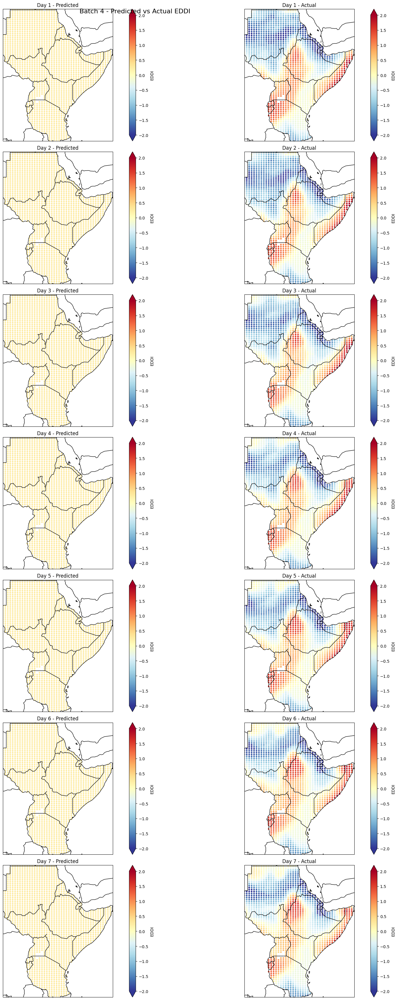

In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd
from matplotlib.colors import TwoSlopeNorm
from IPython.display import display, clear_output

def visualize_predictions(predictions, metadata):
    # Extract predictions and actual values
    y_hat = predictions['y_hat'].squeeze().numpy()
    y = predictions['y'].squeeze().numpy()

    # Get latitude and longitude from metadata
    lats = metadata['lat'].values
    lons = metadata['lon'].values

    # Print debugging information
    print(f"y_hat shape: {y_hat.shape}")
    print(f"y shape: {y.shape}")
    print(f"Number of unique latitudes: {len(np.unique(lats))}")
    print(f"Number of unique longitudes: {len(np.unique(lons))}")

    # Color scheme
    cmap = plt.cm.RdYlBu_r
    norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

    for batch in range(y_hat.shape[0]):
        # Set up the plot for this batch
        fig, axes = plt.subplots(7, 2, figsize=(20, 35),
                                 subplot_kw={'projection': ccrs.PlateCarree()})

        for day in range(y_hat.shape[1]):
            ax_hat = axes[day, 0]
            ax_y = axes[day, 1]

            # Get the data for this day and batch
            z_hat = y_hat[batch, day, :]
            z_y = y[batch, day, :]

            # Plot y_hat
            scatter_hat = ax_hat.scatter(lons, lats, c=z_hat, cmap=cmap, norm=norm, transform=ccrs.PlateCarree(), s=10)
            ax_hat.add_feature(cfeature.COASTLINE)
            ax_hat.add_feature(cfeature.BORDERS)
            ax_hat.set_extent([lons.min(), lons.max(), lats.min(), lats.max()])
            plt.colorbar(scatter_hat, ax=ax_hat, label='EDDI', extend='both')
            ax_hat.set_title(f'Day {day+1} - Predicted')

            # Plot y
            scatter_y = ax_y.scatter(lons, lats, c=z_y, cmap=cmap, norm=norm, transform=ccrs.PlateCarree(), s=10)
            ax_y.add_feature(cfeature.COASTLINE)
            ax_y.add_feature(cfeature.BORDERS)
            ax_y.set_extent([lons.min(), lons.max(), lats.min(), lats.max()])
            plt.colorbar(scatter_y, ax=ax_y, label='EDDI', extend='both')
            ax_y.set_title(f'Day {day+1} - Actual')

        # Add a main title for the batch
        fig.suptitle(f'Batch {batch+1} - Predicted vs Actual EDDI', fontsize=16)

        # Adjust the layout
        plt.tight_layout()

        # Display in the notebook
        display(fig)
        plt.close(fig)

        # Clear the output to avoid cluttering the notebook
        clear_output(wait=True)

# Assuming you have the metadata DataFrame available
metadata = pd.read_parquet('/content/drive/MyDrive/data/metadata.parquet')

# Call the function for each item in predictions_test
for i, pred in enumerate(predictions_test):
    visualize_predictions(pred, metadata)
    print(f"Processed item {i+1}/{len(predictions_test)}")

In [ ]:
# predictions_val = trainer.predict(predictor, datamodule.val_dataloader())

In [ ]:
# predictions_val